C:\Users\RST\Desktop\Minor project\test_venv\lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/20
4468/4468 ━━━━━━━━━━━━━━━━━━━━ 185s 41ms/step - loss: 5.1404e-04
Epoch 2/20
4468/4468 ━━━━━━━━━━━━━━━━━━━━ 180s 40ms/step - loss: 1.3685e-05
Epoch 3/20
4468/4468 ━━━━━━━━━━━━━━━━━━━━ 181s 40ms/step - loss: 1.0969e-05
Epoch 4/20
4468/4468 ━━━━━━━━━━━━━━━━━━━━ 181s 40ms/step - loss: 8.9876e-06
Epoch 5/20
4468/4468 ━━━━━━━━━━━━━━━━━━━━ 183s 41ms/step - loss: 8.2444e-06
Epoch 6/20
4468/4468 ━━━━━━━━━━━━━━━━━━━━ 177s 40ms/step - loss: 7.5417e-06
Epoch 7/20
4468/4468 ━━━━━━━━━━━━━━━━━━━━ 177s 40ms/step - loss: 7.5392e-06
Epoch 8/20
4468/4468 ━━━━━━━━━━━━━━━━━━━━ 175s 39ms/step - loss: 7.4918e-06
Epoch 9/20
4468/4468 ━━━━━━━━━━━━━━━━━━━━ 177s 40ms/step - loss: 7.4449e-06
Epoch 10/20
4468/4468 ━━━━━━━━━━━━━━━━━━━━ 180s 40ms/step - loss: 7.1846e-06
Epoch 11/20
4468/4468 ━━━━━━━━━━━━━━━━━━━━ 179s 40ms/step - loss: 7.0808e-06
Epoch 12/20
4468/4468 ━━━━━━━━━━━━━━━━━━━━ 175s 39ms/step - loss: 7.0896e-06
Epoch 13/20
4468/4468 ━━━━━━━━━━━━━━━━━━━━ 175s 39ms/step - loss: 7.1512e-06
Epoch 14

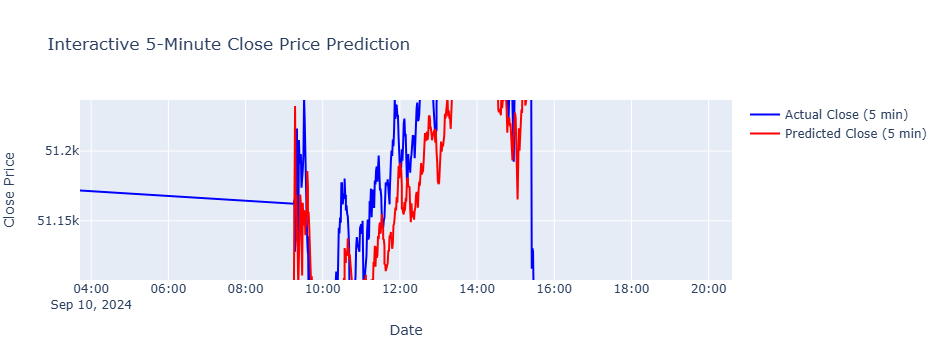

ValueError: Invalid filepath extension for saving. Please add either a `.keras` extension for the native Keras format (recommended) or a `.h5` extension. Use `model.export(filepath)` if you want to export a SavedModel for use with TFLite/TFServing/etc. Received: filepath=saved_model/model_5min.

In [11]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.model_selection import train_test_split
import plotly.graph_objects as go

# Load the dataset
df = pd.read_csv("C:\\Users\\RST\\Desktop\\Minor project\\combined_final1.csv")

# Convert the 'Date' column to datetime and sort by date
df['Date'] = pd.to_datetime(df['Date'])
df = df.sort_values('Date')

# Create target columns (shifting Close price to predict the future)
df['target_5min'] = df['Close'].shift(-5)  # Predict Close 5 minutes into the future
df['target_10min'] = df['Close'].shift(-10)
df['target_15min'] = df['Close'].shift(-15)

# Drop rows with NaN target values (because of the shift)
df = df.dropna()

# Select features for the model
features = ['Open', 'High', 'Low', 'Close']

# Initialize a MinMaxScaler for both features and target
scaler_features = MinMaxScaler(feature_range=(0, 1))
scaler_target = MinMaxScaler(feature_range=(0, 1))

# Normalize features and target
scaled_features = scaler_features.fit_transform(df[features])
scaled_target_5min = scaler_target.fit_transform(df['target_5min'].values.reshape(-1, 1))
scaled_target_10min = scaler_target.fit_transform(df['target_10min'].values.reshape(-1, 1))
scaled_target_15min = scaler_target.fit_transform(df['target_15min'].values.reshape(-1, 1))

# Define a function to create time series data
def create_sequences(data, target, window_size):
    X = []
    y = []
    for i in range(window_size, len(data)):
        X.append(data[i - window_size:i])  # Append the previous 'window_size' data points
        y.append(target[i])  # Append the corresponding target value
    return np.array(X), np.array(y)

# Parameters
window_size = 60  # Use last 60 data points (minutes) to predict the future

# Create sequences for each prediction horizon
X, y_5min = create_sequences(scaled_features, scaled_target_5min, window_size)
_, y_10min = create_sequences(scaled_features, scaled_target_10min, window_size)
_, y_15min = create_sequences(scaled_features, scaled_target_15min, window_size)

# Split the data into training and testing sets
X_train, X_test, y_train_5min, y_test_5min = train_test_split(X, y_5min, test_size=0.2, shuffle=False)
_, _, y_train_10min, y_test_10min = train_test_split(X, y_10min, test_size=0.2, shuffle=False)
_, _, y_train_15min, y_test_15min = train_test_split(X, y_15min, test_size=0.2, shuffle=False)

# Create an LSTM model
def create_model():
    model = Sequential()
    model.add(LSTM(units=100, return_sequences=True, input_shape=(window_size, len(features))))
    model.add(LSTM(units=100))
    model.add(Dense(1))  # Output layer for one feature (predicted Close price)
    model.compile(optimizer='adam', loss='mean_squared_error')
    return model

# Train the models
model_5min = create_model()
model_10min = create_model()
model_15min = create_model()

model_5min.fit(X_train, y_train_5min, epochs=20, batch_size=64)
model_10min.fit(X_train, y_train_10min, epochs=20, batch_size=64)
model_15min.fit(X_train, y_train_15min, epochs=20, batch_size=64)

# Predict on the test data
predictions_5min = model_5min.predict(X_test)
predictions_10min = model_10min.predict(X_test)
predictions_15min = model_15min.predict(X_test)

# Inverse scaling to match original values
predictions_5min_rescaled = scaler_target.inverse_transform(predictions_5min)
y_test_5min_rescaled = scaler_target.inverse_transform(y_test_5min)

# Plot the results using Plotly
fig = go.Figure()

# Add actual and predicted traces
fig.add_trace(go.Scatter(x=df['Date'].iloc[-len(y_test_5min_rescaled):], y=y_test_5min_rescaled.flatten(),
                         mode='lines', name='Actual Close (5 min)', line=dict(color='blue')))
fig.add_trace(go.Scatter(x=df['Date'].iloc[-len(predictions_5min_rescaled):], y=predictions_5min_rescaled.flatten(),
                         mode='lines', name='Predicted Close (5 min)', line=dict(color='red')))

# Customize layout
fig.update_layout(
    title='Interactive 5-Minute Close Price Prediction',
    xaxis_title='Date',
    yaxis_title='Close Price',
    hovermode='x unified'
)

# Show interactive plot
fig.show()

# Saving the rescaled data for further use in another cell
predicted_values_5min = predictions_5min_rescaled.flatten()
actual_values_5min = y_test_5min_rescaled.flatten()

# Saving these values into a CSV or variables to plot later
np.savetxt("predicted_5min.csv", predicted_values_5min, delimiter=",")
np.savetxt("actual_5min.csv", actual_values_5min, delimiter=",")

# Save as TensorFlow SavedModel
model_5min.save('saved_model/model_5min')
model_10min.save('saved_model/model_10min')
model_15min.save('saved_model/model_15min')



In [6]:
from tensorflow.keras.models import load_model
model.save(os.path.join('models','predictor.h5'))

In [13]:
model_5min.save('model_5min.h5')
model_10min.save('model_10min.h5')
model_15min.save('model_15min.h5')

In [14]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np

# Calculate Mean Squared Error (MSE)
mse_5min = mean_squared_error(y_test_5min_rescaled, predictions_5min_rescaled)
mse_10min = mean_squared_error(scaler_target.inverse_transform(y_test_10min), scaler_target.inverse_transform(predictions_10min))
mse_15min = mean_squared_error(scaler_target.inverse_transform(y_test_15min), scaler_target.inverse_transform(predictions_15min))

# Calculate Root Mean Squared Error (RMSE)
rmse_5min = np.sqrt(mse_5min)
rmse_10min = np.sqrt(mse_10min)
rmse_15min = np.sqrt(mse_15min)

# Calculate Mean Absolute Error (MAE)
mae_5min = mean_absolute_error(y_test_5min_rescaled, predictions_5min_rescaled)
mae_10min = mean_absolute_error(scaler_target.inverse_transform(y_test_10min), scaler_target.inverse_transform(predictions_10min))
mae_15min = mean_absolute_error(scaler_target.inverse_transform(y_test_15min), scaler_target.inverse_transform(predictions_15min))

# Calculate R-squared (R²)
r2_5min = r2_score(y_test_5min_rescaled, predictions_5min_rescaled)
r2_10min = r2_score(scaler_target.inverse_transform(y_test_10min), scaler_target.inverse_transform(predictions_10min))
r2_15min = r2_score(scaler_target.inverse_transform(y_test_15min), scaler_target.inverse_transform(predictions_15min))

# Print the results
print(f"5-Minute Prediction: MSE = {mse_5min}, RMSE = {rmse_5min}, MAE = {mae_5min}, R² = {r2_5min}")
print(f"10-Minute Prediction: MSE = {mse_10min}, RMSE = {rmse_10min}, MAE = {mae_10min}, R² = {r2_10min}")
print(f"15-Minute Prediction: MSE = {mse_15min}, RMSE = {rmse_15min}, MAE = {mae_15min}, R² = {r2_15min}")


5-Minute Prediction: MSE = 4789.317091579733, RMSE = 69.20489210727615, MAE = 45.24991261393525, R² = 0.9989914172144437
10-Minute Prediction: MSE = 10672.173807890818, RMSE = 103.30621379128566, MAE = 70.72457968341213, R² = 0.9977528158022796
15-Minute Prediction: MSE = 12445.013548658073, RMSE = 111.55722096152303, MAE = 74.11294806808483, R² = 0.9973798285820494


In [ ]:
predictions_5min = model_5min.predict(X_test)